In [6]:
import numpy as np
from pathlib import Path
import cv2
import matplotlib.pyplot as plt

In [11]:
pic_path = Path('data/pic/sample')
!ls {pic_path}

LED_correct_black_16.JPG  LED_correct_wood_37.JPG  LED_correct_wood_8.JPG
LED_correct_black_6.JPG   LED_correct_wood_48.JPG


In [5]:
filename = 'LED_correct_black_16.JPG'
filepath = pic_path / filename

In [7]:
def get_blurr(im, threshold = 175):
    gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY) # transform image to grayscale, since coloration is not of interest
    blurr = cv2.Laplacian(gray, cv2.CV_64F).var() # the degree of blurrines (or rather sharpness)
    
    test = blurr > threshold
    
    return blurr, test

In [12]:
get_blurr(im)

(176.32199064717696, True)

## Gray

In [26]:
gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

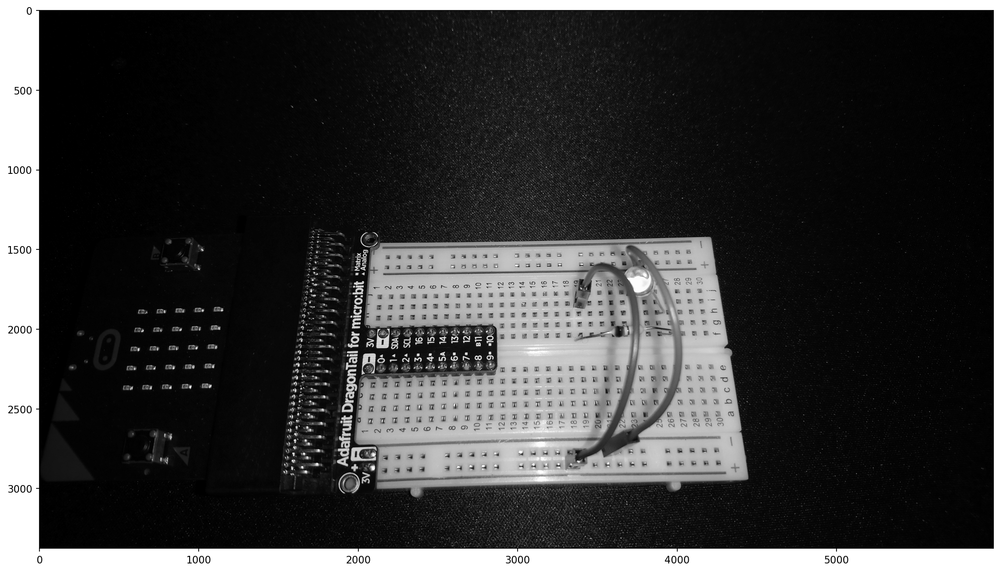

In [27]:
plt.figure(figsize = (20,10), dpi = 150)
plt.imshow(gray, cmap = 'gray')
plt.show()

## Sharpen

In [28]:
kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
sharp = cv2.filter2D(gray, -1, kernel)

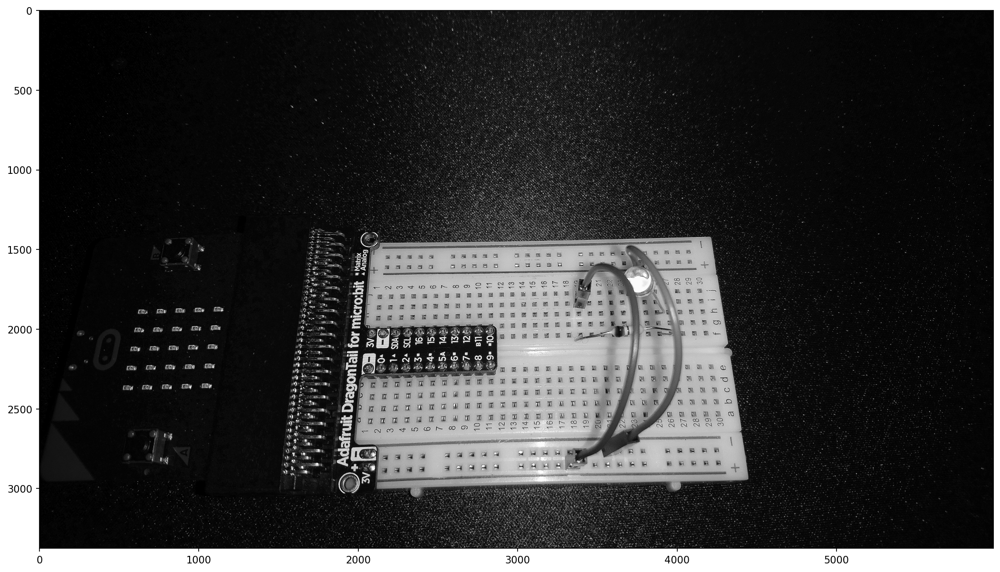

In [29]:
plt.figure(figsize = (20,10), dpi = 150)
plt.imshow(sharp, cmap = 'gray')
plt.show()

### Contrast

In [31]:
enhanced = cv2.equalizeHist(gray)

In [36]:
alpha = 1.5 # Contrast control (1.0-3.0)
beta = 0 # Brightness control (0-100)

enhanced = cv2.convertScaleAbs(gray, alpha=alpha, beta=beta)

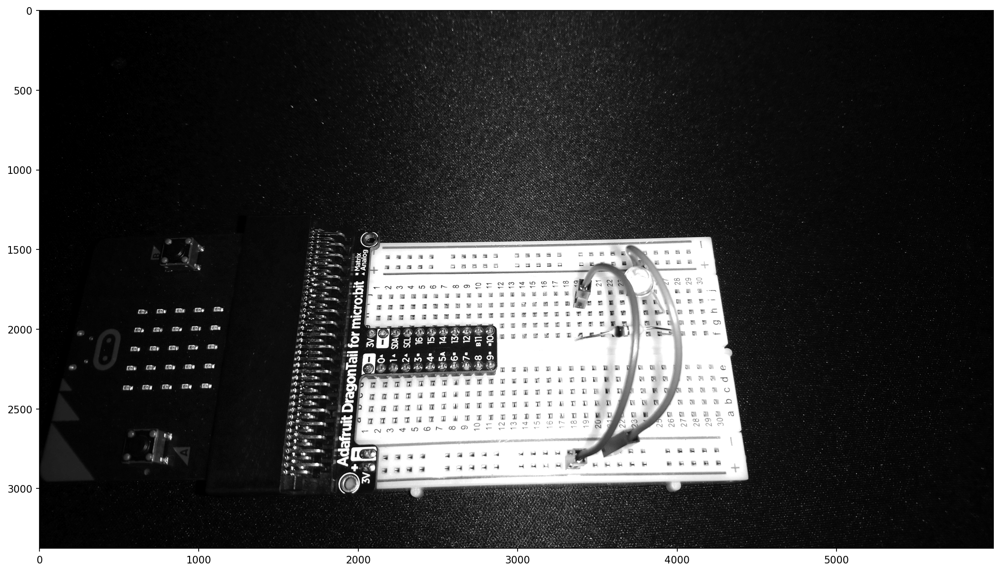

In [39]:
plt.figure(figsize = (20,10), dpi = 150)
plt.imshow(enhanced, cmap = 'gray')
plt.show()

In [40]:
plt.imsave('sizeOfPicture.jpg',enhanced)

### Size

<Figure size 1800x1200 with 0 Axes>

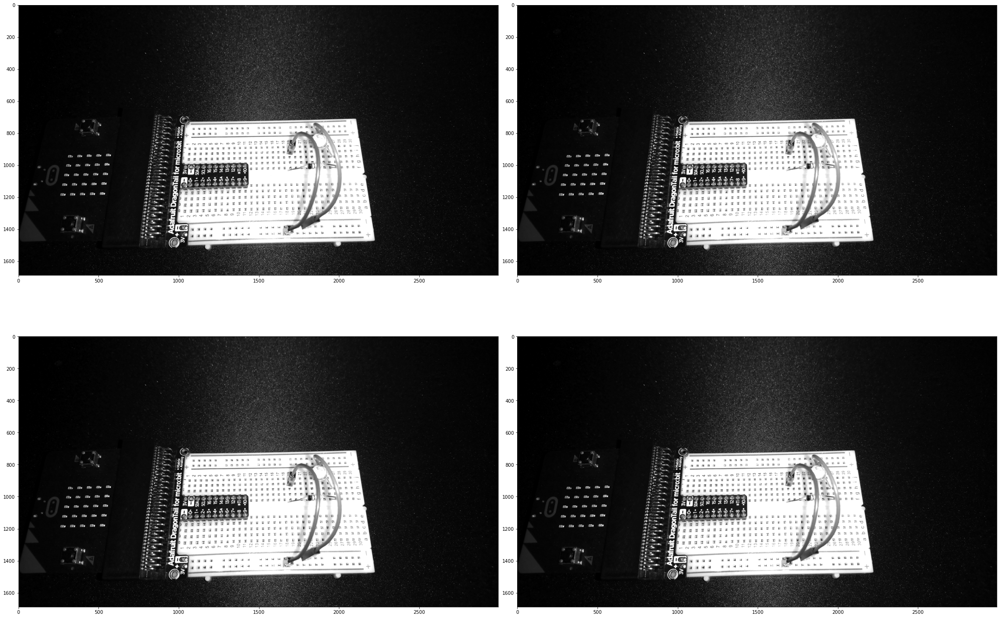

In [63]:
height = gray.shape[0]
width = gray.shape[1]

plt.figure(dpi = 300)
fig, ax = plt.subplots(2,2, figsize = (30,20))
ax = ax.flatten()
plt.tight_layout()

for i in range(4):
    dsize = (int(width / 2.), int(height / 2.))
    output = cv2.resize(enhanced, dsize)
    ax[i].imshow(output, cmap = 'gray')

In [70]:
height = gray.shape[0]
width = gray.shape[1]

In [74]:
width, height = (int(width / 2.), int(height / 2.))
dsize = width,height

output = cv2.resize(enhanced, dsize)
plt.imsave(str(dsize)+'.jpg',output)

Under ~1400x?? its hard to see any detail, cut out relevant space!